## 1.RNN网络原理

### 单层RNN

<div>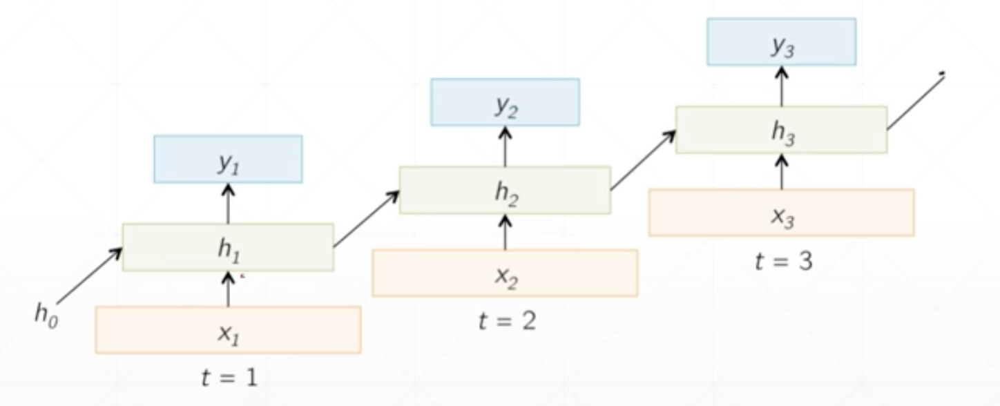</div>

<div>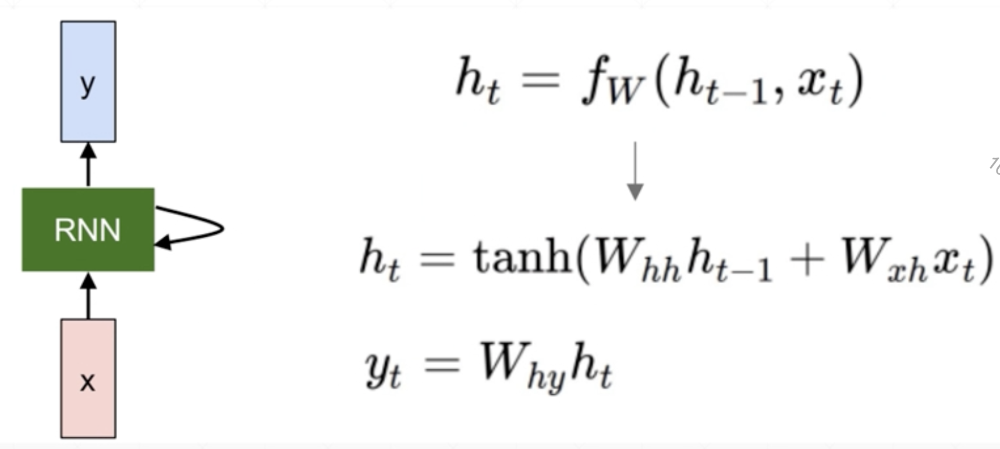</div>

<div>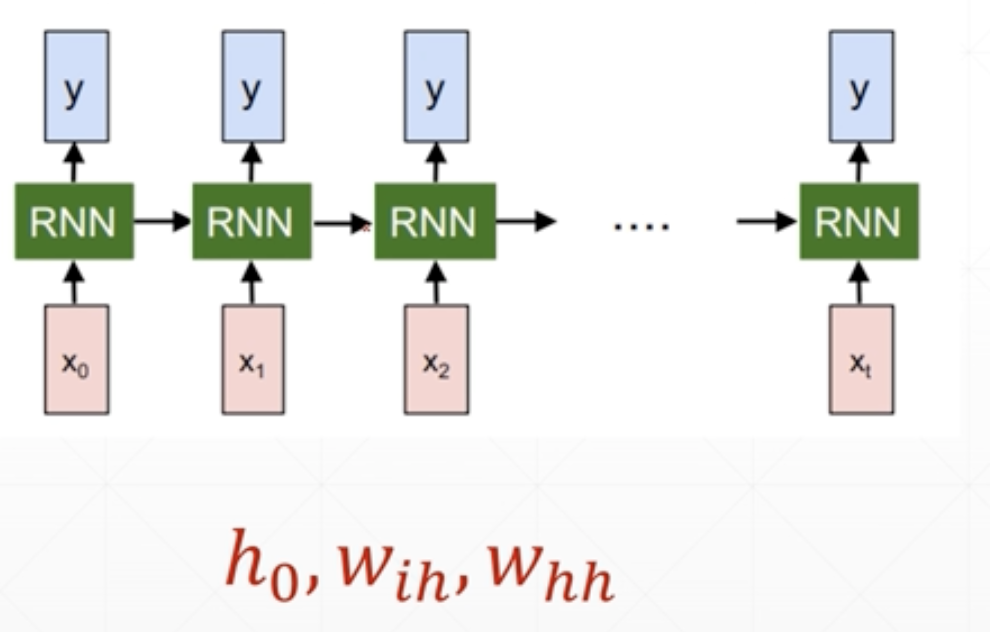</div>

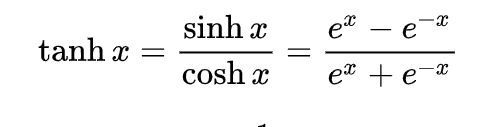

双曲正切函数（tanh）是双曲正弦函数（sinh）与双曲余弦函数（cosh）的比值

In [52]:
import torch.nn as nn
rnn=nn.RNN(input_size=100,hidden_size=20,num_layers=1,bias=False)
print(rnn)

RNN(100, 20, bias=False)


In [53]:
import torch
x=torch.randn(10,3,100)#10 is the number of words, 3 is the number of words put in the network at one time and
# and batch. 100 is the single word's features.也可以理解为：词向量可以用（3，10）来表示。
# print("x",x)
out, h =rnn(x,torch.zeros(1,3,20))
print('out.shape:{},h.shape:{}'.format(out.shape,h.shape))#out is all of final result(for all words), but h is just 
#the memory of last word
print("out:",out[9,:,:])
print("h:",h)

out.shape:torch.Size([10, 3, 20]),h.shape:torch.Size([1, 3, 20])
out: tensor([[ 0.9895,  0.2151, -0.2186,  0.7551,  0.9465, -0.1558,  0.7956,  0.8235,
         -0.0440,  0.3012, -0.6102, -0.9554, -0.8859,  0.4837,  0.3554,  0.7893,
         -0.7564,  0.4050,  0.9383, -0.9876],
        [-0.9932,  0.3024, -0.7053, -0.5454, -0.7135,  0.5155,  0.7003, -0.9397,
         -0.5776, -0.6562, -0.1381, -0.4773, -0.5569, -0.0769,  0.8049,  0.4264,
         -0.6817, -0.0154,  0.5981, -0.1005],
        [-0.3677, -0.6554,  0.7424,  0.9930, -0.5264, -0.9462, -0.7574, -0.1234,
         -0.9673,  0.9723, -0.7027, -0.9521,  0.9962,  0.8778, -0.2702,  0.7917,
         -0.8009, -0.4563,  0.8932, -0.0146]], grad_fn=<SliceBackward0>)
h: tensor([[[ 0.9895,  0.2151, -0.2186,  0.7551,  0.9465, -0.1558,  0.7956,
           0.8235, -0.0440,  0.3012, -0.6102, -0.9554, -0.8859,  0.4837,
           0.3554,  0.7893, -0.7564,  0.4050,  0.9383, -0.9876],
         [-0.9932,  0.3024, -0.7053, -0.5454, -0.7135,  0.5155,  

In [54]:
rnn._parameters.keys()

odict_keys(['weight_ih_l0', 'weight_hh_l0'])

In [55]:
rnn._parameters##(20,20)

OrderedDict([('weight_ih_l0',
              Parameter containing:
              tensor([[-0.1359, -0.1990,  0.1529,  ..., -0.1459, -0.1383, -0.0932],
                      [ 0.0607, -0.0499,  0.0055,  ...,  0.1127,  0.1397, -0.0842],
                      [-0.1845, -0.1358, -0.1476,  ...,  0.1188, -0.0114,  0.0010],
                      ...,
                      [ 0.0824,  0.1513, -0.1401,  ...,  0.0778,  0.0216, -0.1844],
                      [-0.1308,  0.2040, -0.0853,  ..., -0.1730, -0.2105, -0.0922],
                      [-0.2006,  0.0113, -0.0537,  ...,  0.0479, -0.0338,  0.1075]],
                     requires_grad=True)),
             ('weight_hh_l0',
              Parameter containing:
              tensor([[ 1.4901e-01, -2.7594e-02, -2.1836e-01,  6.5584e-02,  1.3929e-01,
                       -1.4776e-01, -8.0648e-02,  6.6758e-02,  1.4329e-01,  4.0250e-02,
                       -5.1513e-02,  5.6033e-02, -1.0970e-01, -1.2192e-01, -1.1556e-01,
                       -1.939

In [56]:
rnn.weight_ih_l0.shape

torch.Size([20, 100])

In [57]:
rnn.weight_hh_l0.shape

torch.Size([20, 20])

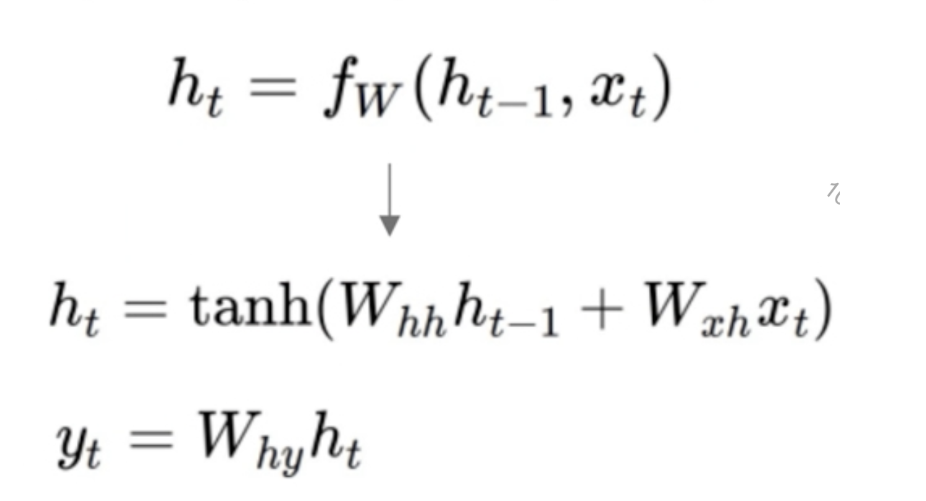

In [68]:
w_xh_x0=x[0,:,:]@rnn.weight_ih_l0.T

In [69]:
w_hh_h0=torch.zeros(1,3,20)@rnn.weight_hh_l0.T

In [70]:
w_xh_x0+w_hh_h0

tensor([[[-1.0556, -0.3260,  0.1216,  0.6028, -1.6350, -0.9516,  0.2511,
          -0.0714, -0.5625,  0.5072,  0.5608,  0.8120, -0.4683, -1.1885,
          -0.8305, -0.8784,  0.3731, -1.8963, -1.2205, -0.1754],
         [ 0.7779,  0.5118, -2.0326,  0.8465, -0.5048,  1.7186, -1.3675,
          -1.9411,  0.9609, -0.4261, -0.3897,  3.7875, -1.6508, -0.7693,
           0.9965,  0.1063, -0.1158,  0.0856, -1.2683, -1.3697],
         [-0.5243, -0.5980,  1.5668, -3.2548, -1.4564, -1.0013,  0.1444,
           2.9403, -0.9009,  1.6727, -2.5942,  0.9741,  0.1213,  2.8369,
           1.3380, -0.5407, -0.6645,  0.1322,  1.2471, -1.2072]]],
       grad_fn=<AddBackward0>)

In [73]:
torch.tanh(w_xh_x0+w_hh_h0)

tensor([[[-0.7840, -0.3149,  0.1210,  0.5390, -0.9268, -0.7405,  0.2459,
          -0.0713, -0.5098,  0.4678,  0.5085,  0.6707, -0.4369, -0.8301,
          -0.6807, -0.7056,  0.3567, -0.9559, -0.8398, -0.1737],
         [ 0.6515,  0.4714, -0.9663,  0.6892, -0.4659,  0.9377, -0.8781,
          -0.9596,  0.7447, -0.4021, -0.3711,  0.9990, -0.9290, -0.6465,
           0.7601,  0.1059, -0.1153,  0.0854, -0.8533, -0.8786],
         [-0.4810, -0.5356,  0.9165, -0.9970, -0.8970, -0.7621,  0.1434,
           0.9944, -0.7167,  0.9319, -0.9889,  0.7505,  0.1207,  0.9932,
           0.8712, -0.4935, -0.5813,  0.1315,  0.8475, -0.8358]]],
       grad_fn=<TanhBackward0>)

In [74]:
out[0,:,:]

tensor([[-0.7840, -0.3149,  0.1210,  0.5390, -0.9268, -0.7405,  0.2459, -0.0713,
         -0.5098,  0.4678,  0.5085,  0.6707, -0.4369, -0.8301, -0.6807, -0.7056,
          0.3567, -0.9559, -0.8398, -0.1737],
        [ 0.6515,  0.4714, -0.9663,  0.6892, -0.4659,  0.9377, -0.8781, -0.9596,
          0.7447, -0.4021, -0.3711,  0.9990, -0.9290, -0.6465,  0.7601,  0.1059,
         -0.1153,  0.0854, -0.8533, -0.8786],
        [-0.4810, -0.5356,  0.9165, -0.9970, -0.8970, -0.7621,  0.1434,  0.9944,
         -0.7167,  0.9319, -0.9889,  0.7505,  0.1207,  0.9932,  0.8712, -0.4935,
         -0.5813,  0.1315,  0.8475, -0.8358]], grad_fn=<SliceBackward0>)

### 多层RNN

<div>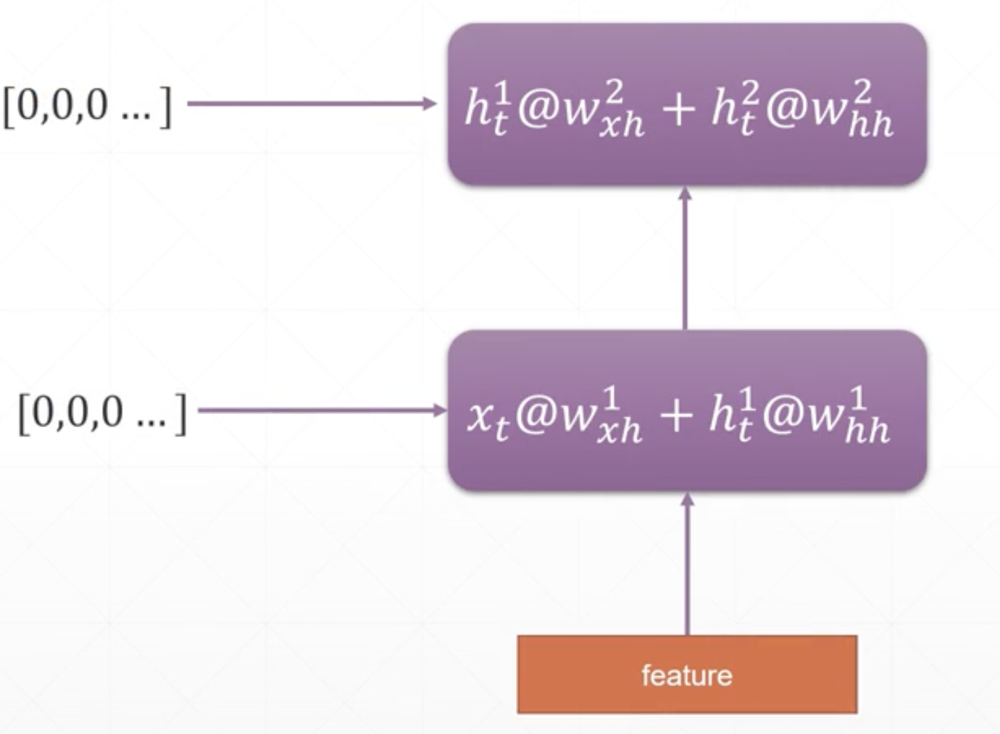</div>

In [78]:
rnn_2=nn.RNN(100,10,num_layers=2)
rnn_2._parameters.keys()


odict_keys(['weight_ih_l0', 'weight_hh_l0', 'bias_ih_l0', 'bias_hh_l0', 'weight_ih_l1', 'weight_hh_l1', 'bias_ih_l1', 'bias_hh_l1'])

In [79]:
print(rnn_2)

RNN(100, 10, num_layers=2)


In [80]:
rnn_2.weight_hh_l0.shape

torch.Size([10, 10])

In [81]:
rnn_2.weight_ih_l0.shape

torch.Size([10, 100])

In [82]:
x_2=torch.randn(10,5,100)

In [85]:
out, h =rnn_2(x_2,torch.zeros(2,5,10))
out.shape

torch.Size([10, 5, 10])

In [86]:
h.shape

torch.Size([2, 5, 10])

In [77]:
x=[torch.randn(3,100),torch.randn(3,100),torch.randn(3,100),torch.randn(3,100),torch.randn(3,100)]
cell1=nn.RNNCell(100,30)
cell2=nn.RNNCell(30,20)
h10=torch.zeros(3,30)
h20=torch.zeros(3,20)
for xt in x:
    h11=cell1(xt,h10)
    h21=cell2(h10,h20)
print(h21.shape)

torch.Size([3, 20])


In [ ]:
x=torch.randn(5,3,100)


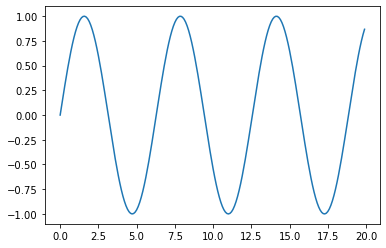

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib
%matplotlib inline
x=np.arange(0,20,0.1)
plt.plot(x,np.sin(x))
plt.show()

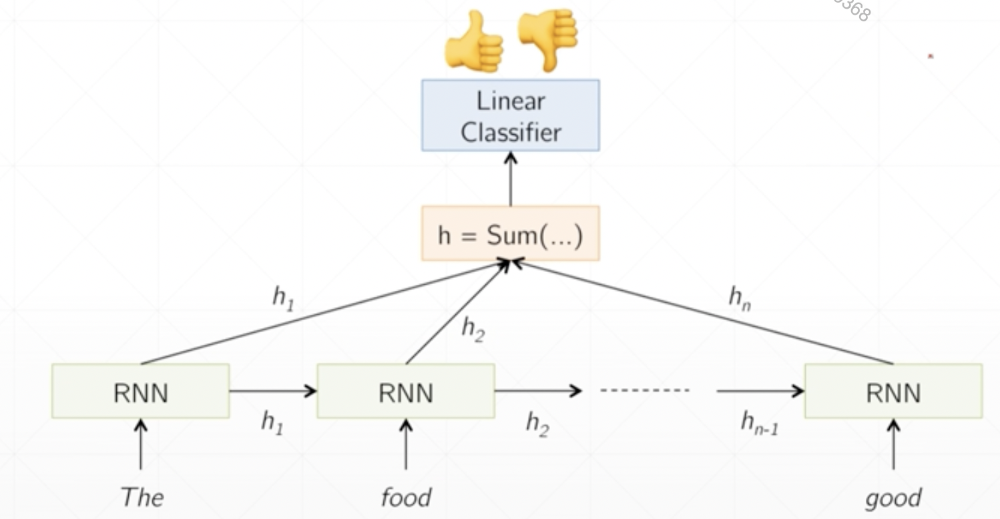

In [8]:
x_t=torch.randn(5,3,100)
x_v=x_t.reshape(-1,100)
x_v.shape

torch.Size([15, 100])

In [15]:
class Net(nn.Module):
    def __init__(self,):
        super(Net,self).__init__()
        self.rnn=nn.RNN(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=1,
            batch_first=True#默认seq_len first,seq_len在处理语言中可以理解为字数，在时间序列中可以理解为一次输入的时间点个数
        )
        self.linear=nn.Linear(hidden_size,output_size)
    def forward(self,x,hidden_prev):
        out,hidden_prev=self.rnn(x,hidden_prev)
        out=out.view(-1,hidden_size)
        out=self.linear(out)
        out=out.unsqueeze(dim=0)
        return out,
    
        

# miaoming_f@cueb.edu.cn 姓名+学号+周四

In [17]:
import numpy as np
hidden_size=10#可以理解为隐含层的连接数，也可以理解为h0的特征数
input_size=1#x特征值
output_size=1
lr=0.0001

model=Net()
criterion=nn.MSELoss()
optimizer=torch.optim.Adam(model.parameters(),lr)
hidden_prev=torch.zeros(1,1,hidden_size)


for iter in range(5000):
    start=np.random.randint(10,size=1)[0]#起点是个随机数，low、high、size三个参数。默认high是None,如果只有low，那范围就是[0,low)
    num_time_steps=30
    time_steps=np.linspace(start,start+10,num_time_steps)
    data=np.sin(time_steps)
    data=data.reshape(num_time_steps,1)
    x=torch.tensor(data[:-1]).float().view(1,num_time_steps-1,1)
    y=torch.tensor(data[1:]).float().view(1,num_time_steps-1,1)
    output,hidden_prev=model(x,hidden_prev)
#     print("output.shape:",output.shape)
#     print("hidden_prev.shape:",hidden_prev.shape)
    hidden_prev=hidden_prev.detach()
    loss=criterion(output,y)
    model.zero_grad()
    loss.backward()
    optimizer.step()
    if iter%100==0:
        print("iteration:{}loss{}".format(iter,loss.item()))

iteration:0loss0.7301521897315979
iteration:100loss0.5979222655296326
iteration:200loss0.5823697447776794
iteration:300loss0.5540962815284729
iteration:400loss0.4582628309726715
iteration:500loss0.4355994164943695
iteration:600loss0.3258630633354187
iteration:700loss0.28474369645118713
iteration:800loss0.24350297451019287
iteration:900loss0.243925541639328
iteration:1000loss0.1902720034122467
iteration:1100loss0.1786089539527893
iteration:1200loss0.11613254249095917
iteration:1300loss0.12583330273628235
iteration:1400loss0.10106153786182404
iteration:1500loss0.08845998346805573
iteration:1600loss0.033252619206905365
iteration:1700loss0.07861755043268204
iteration:1800loss0.030065171420574188
iteration:1900loss0.03647753223776817
iteration:2000loss0.014849583618342876
iteration:2100loss0.061610691249370575
iteration:2200loss0.06561845541000366
iteration:2300loss0.0448911115527153
iteration:2400loss0.05647216737270355
iteration:2500loss0.04178271442651749
iteration:2600loss0.076701961457

In [18]:
print(model)

Net(
  (rnn): RNN(1, 10, batch_first=True)
  (linear): Linear(in_features=10, out_features=1, bias=True)
)


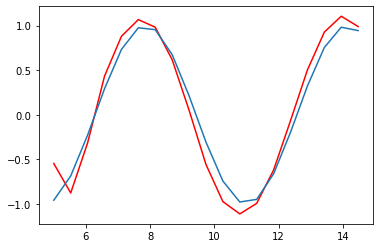

In [66]:
num_time_stepstest=20
start=5
time_stepstest=np.linspace(start,start+10,num_time_stepstest)
datatest=np.sin(time_stepstest)
datatest=datatest.reshape(num_time_stepstest,1)
hidden_prev=torch.zeros(1,1,10)
x_test=torch.tensor(datatest[:-1]).float().view(1,num_time_stepstest-1,1)
predtest,hidden_test=model(x_test,hidden_prev)
plt.plot(time_stepstest[:-1],predtest.detach().numpy()[0].squeeze(1),color="red")
plt.plot(time_stepstest[:-1],np.sin(time_stepstest[:-1]))

In [49]:
predictions=[]
input=x[:,0,:]
for _ in range(x.shape[1]):
    input=input.view(1,1,1)
    pred,hidden_prev=model(input,hidden_prev)
#     print("pred.shape:",pred.shape)
#     print("hidden_prev.shape:",hidden_prev.shape)
    input=pred
    predictions.append(pred.detach().numpy().ravel()[0])
print(predictions)

[0.408117, 0.9347678, 0.9199918, 0.9421398, 0.8171879, 0.5940872, 0.31295025, 0.0055645257, -0.30038518, -0.57273656, -0.7813644, -0.89988524, -0.90585464, -0.79543674, -0.5926954, -0.3371526, -0.0665054, 0.19424544, 0.43326074, 0.640738, 0.7927097, 0.8504502, 0.7897664, 0.62248844, 0.38080984, 0.0969934, -0.19958214, -0.47758496, -0.70511836]


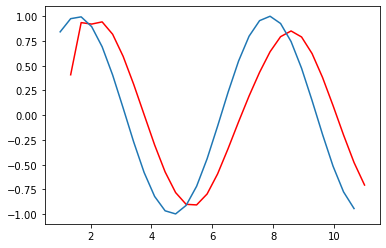

In [50]:
plt.plot(time_steps[1:30],predictions,color="red")
plt.plot(time_steps[0:29],np.sin(time_steps[0:29]))

## 2. LSTM

RNN的起源颇有争论，有人认为下面这两篇文献为RNN的源头：

1. Rumelhart, David E; Hinton,Geoffrey E, and Williams, Ronald J Learning internal representations by errorpropagation. Tech. rep. ICS 8504. San Diego, California: Institutefor Cognitive Science, University of California. Sept. 1985.

2. Jordan, Michael I.. Serialorder: a parallel distributed processing approach. Tech. rep. ICS8604. San Diego, California: Institute for Cognitive Science, University ofCalifornia. May 1986.

也有人认为J J Hopfield的论文才是最早明确提出RNN概念的文章。

3. J J Hopfield. Neuralnetworks and physical systems with emergent collective computational abilities.Proc. Natl. Acad. Sci. Vol. 79, pp.2554-2558, April 1982.

LSTM的起源则比较明确，就是Hochreiter和Schmidhuber发表的经典论文。4. Sepp Hochreiter, Jürgen Schmidhuber; Long Short-Term Memory. NeuralComput 1997; 9 (8): 1735–1780.

Transformer则源自Google NLP团队在2017年发表的论文——Attention is all you need。

#### 为什么会发展出lstm

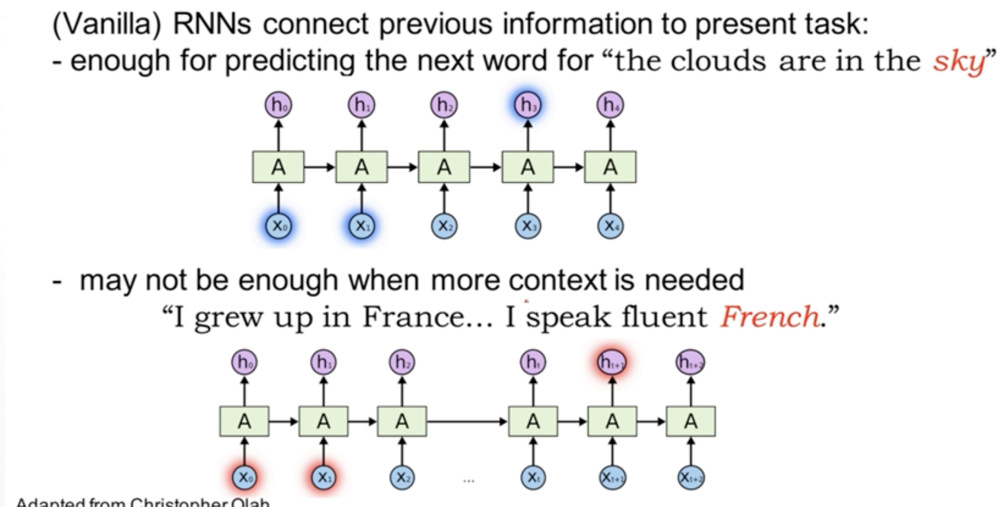

<div>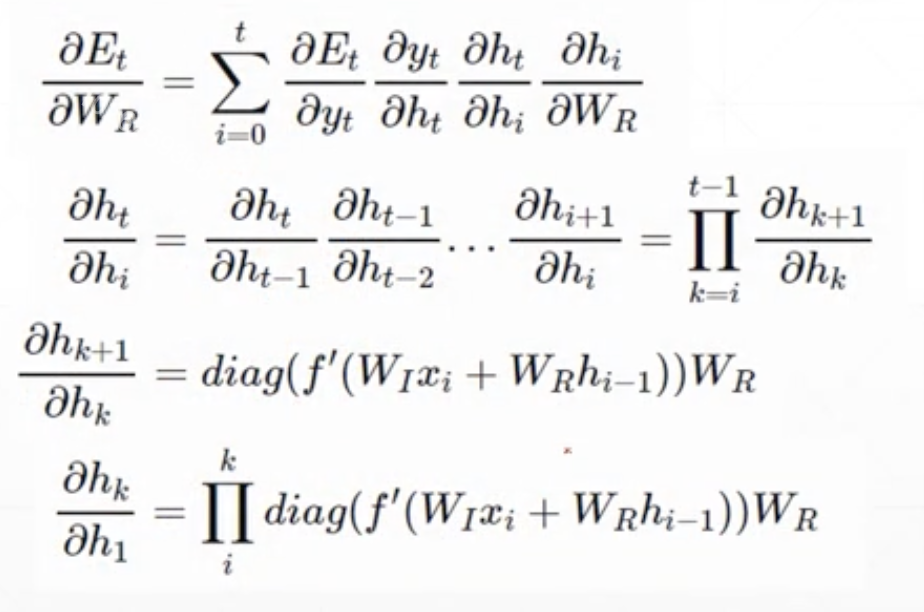</div>

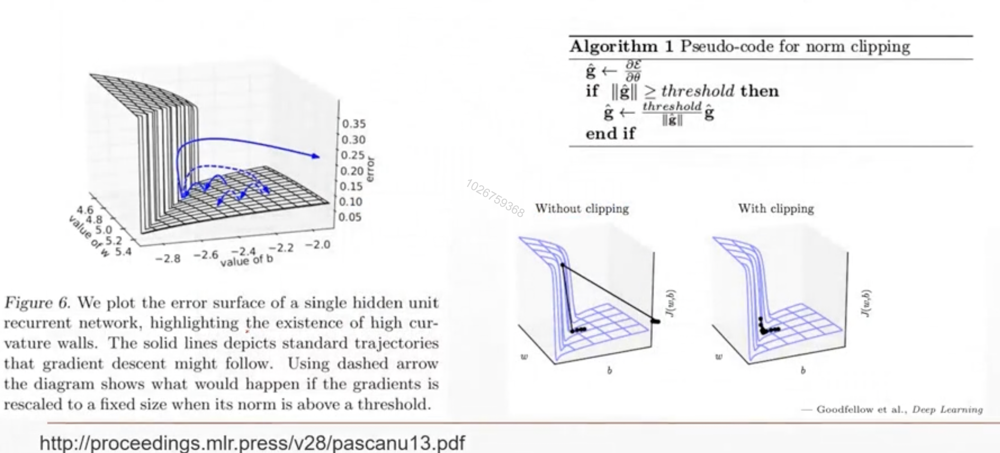

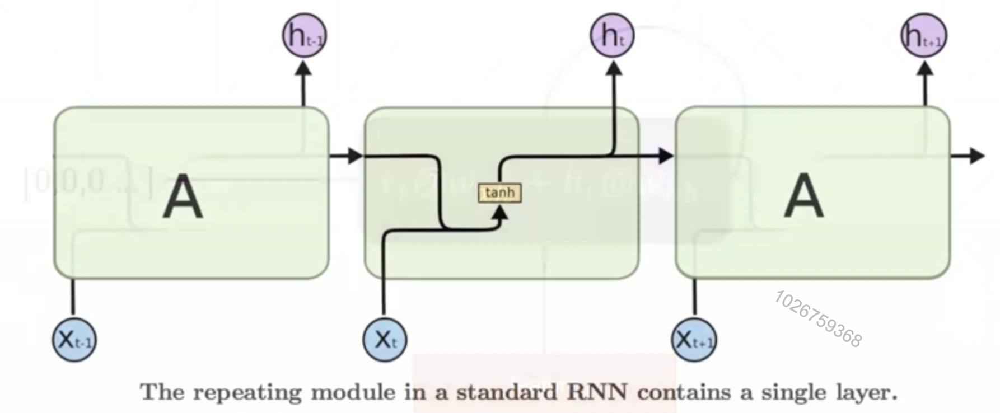

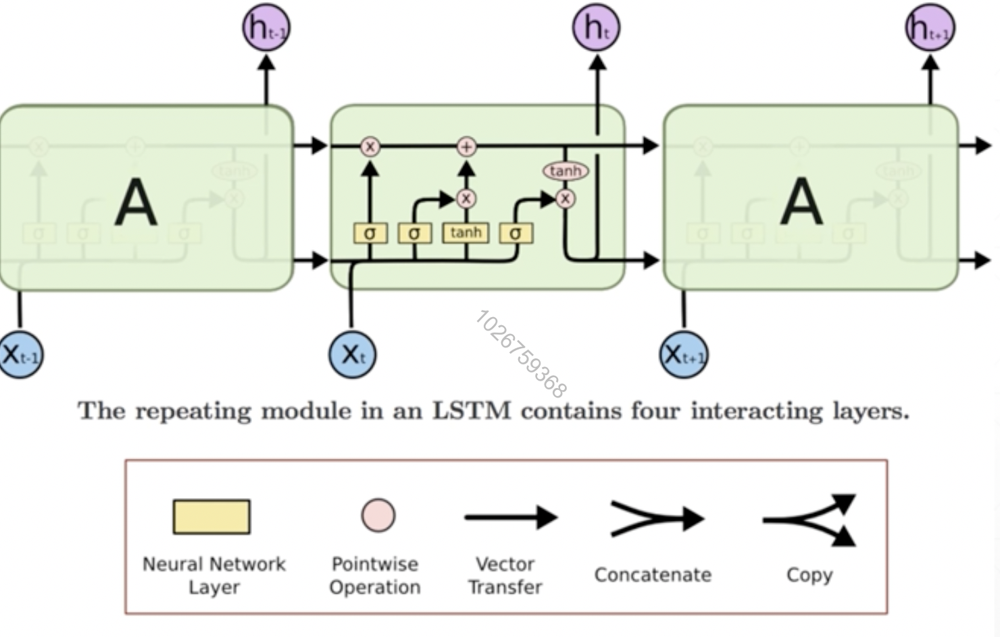

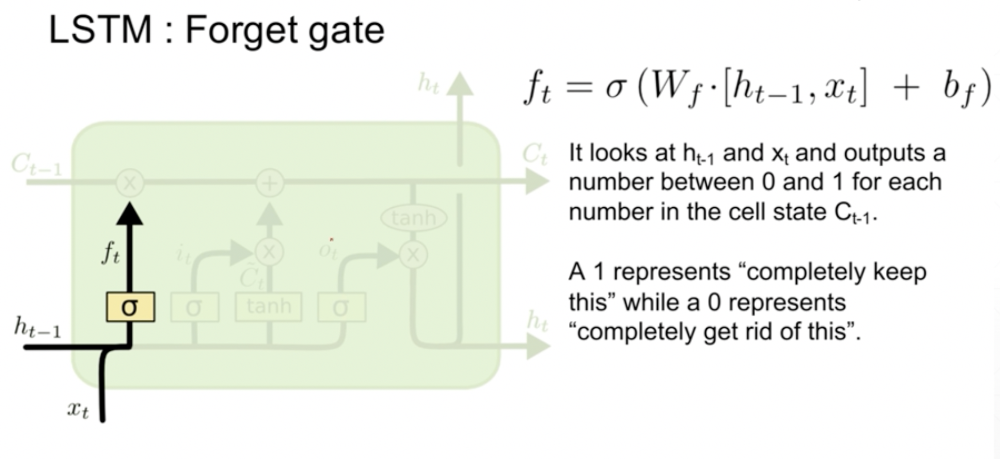

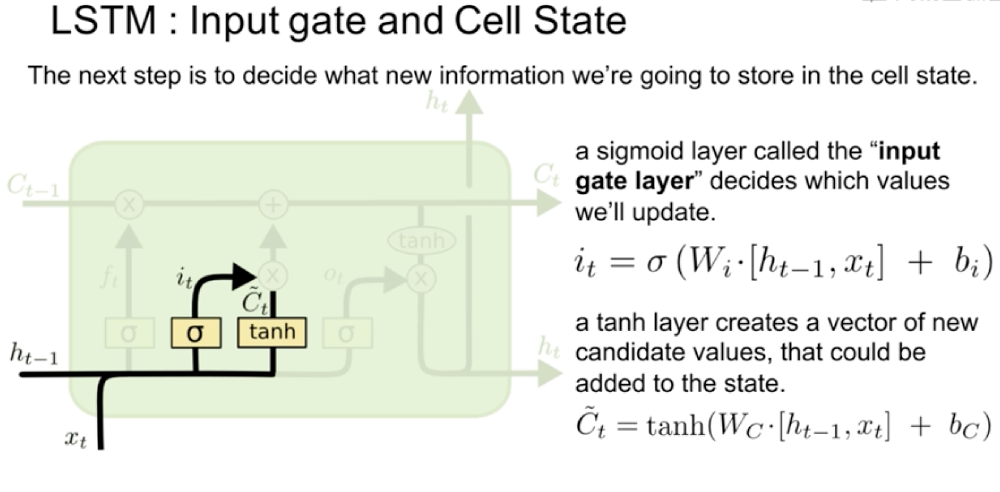

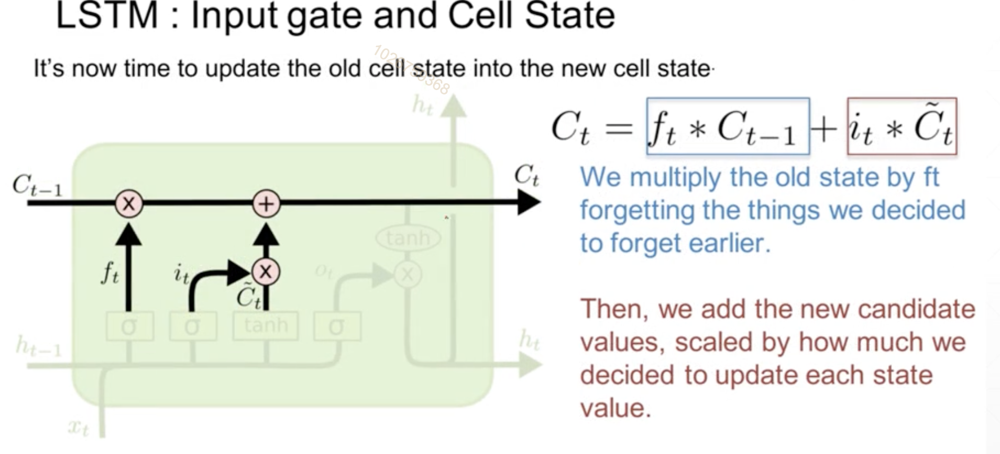

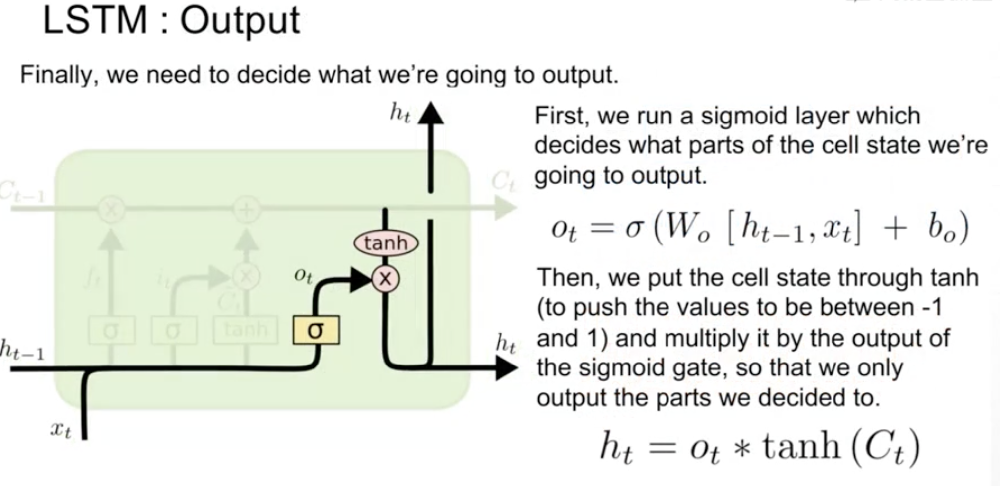

https://weberna.github.io/blog/2017/11/15/LSTM-Vanishing-Gradients.html

In [2]:
import torch.nn as nn
import torch
lstm=nn.LSTM(input_size=100,hidden_size=20,num_layers=4)
print(lstm)

LSTM(100, 20, num_layers=4)


/Users/apple/opt/anaconda3/envs/chatter/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
x=torch.randn(10,3,100)
out,(h,c)=lstm(x)
print(out.shape,h.shape,c.shape)
print(x)
# print('out:',out)
# print("h:",h)

torch.Size([10, 3, 20]) torch.Size([4, 3, 20]) torch.Size([4, 3, 20])
tensor([[[-1.9742e+00, -3.1087e-02,  1.3633e+00,  ..., -1.4091e+00,
          -1.9859e+00, -1.1444e-01],
         [-1.9184e-01, -3.6893e-01,  3.7496e-01,  ...,  7.8539e-01,
          -5.7914e-01,  1.1984e+00],
         [ 2.3120e-01,  2.7477e-01,  9.8815e-01,  ...,  1.0570e+00,
           9.3871e-01,  2.1644e-02]],

        [[-3.8883e-02,  1.0322e+00, -8.0685e-01,  ...,  4.8526e-01,
           1.2160e+00,  1.7254e+00],
         [ 1.1820e-01,  1.1422e+00,  5.8211e-01,  ...,  5.9320e-01,
          -1.5501e+00, -1.2725e+00],
         [-4.3548e-01, -8.6585e-01, -1.4538e-01,  ..., -2.8819e-01,
           4.1584e-01,  2.0955e+00]],

        [[ 4.2986e-01, -7.1426e-01,  6.4126e-01,  ...,  2.3112e-01,
           2.0281e-01,  1.0861e+00],
         [-1.3564e+00, -8.0924e-01, -1.7457e+00,  ...,  1.2837e+00,
          -2.5426e-01,  5.9670e-01],
         [ 5.4505e-01,  2.0327e-01, -4.2045e-01,  ..., -3.7176e-01,
           9.8409e

In [5]:
import pandas as pd
df=pd.read_csv("IMDBDataset.csv")
df.head()

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive
